In [51]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math

1.1. Quantization & Interpolation

1.1.1. For two cases as without and with histogram equalization (uniform histogram), display the quantized image in (4,8,16,32,64,128) Levels and its histograms. Also, the optimum mean square error obtained for each case. Discuss and report the results for the gray Elaine image. It should be noted, you can use rgb2gray, histeq and immse functions for this problem.

In [52]:
def normalizeImage(img, bits):
    MIN = 0
    MAX = 255
    NEW_MAX = 2 ** bits - 1
    NEW_MIN = 0

    convertedImg = (((img - MIN) / (MAX - MIN)) *
                    (NEW_MAX - NEW_MIN)) + NEW_MIN
    convertedImg = np.round(convertedImg)
    convertedImg = convertedImg.astype(int)
    return convertedImg


In [53]:
def calculateHist(img, noBins=256):
    histValues = np.zeros(noBins, dtype=int)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            grayLevel1 = img[i][j]
            histValues[grayLevel1] += 1

    return histValues

In [54]:
def getBins(count):
    bins = np.empty(count, dtype=int)
    for i in range(count):
        bins[i] = i
    return bins


In [55]:
def quantize_simulation(image, n_bits):
    coeff = 2**8 // 2**n_bits
    return (image // coeff) * coeff

In [56]:
def calculateMSE(img, equalizedImg):
    return np.square(np.subtract(img, equalizedImg)).mean()

In [57]:
Elaine = cv2.imread("images/1/Elaine.bmp", cv2.IMREAD_GRAYSCALE)

In [58]:
Elaine_4 = normalizeImage(Elaine, 2)
Elaine_8 = normalizeImage(Elaine, 3)
Elaine_16 = normalizeImage(Elaine, 4)
Elaine_32 = normalizeImage(Elaine, 5)
Elaine_64 = normalizeImage(Elaine, 6)
Elaine_128 = normalizeImage(Elaine, 7)

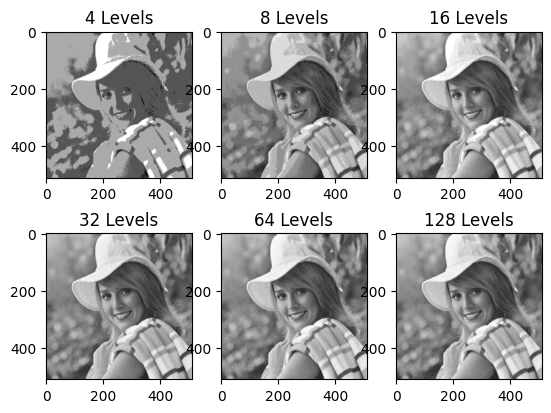

In [59]:
plt.subplot(2, 3, 1)
plt.title("4 Levels")
plt.imshow(Elaine_4, cmap="gray")

plt.subplot(2, 3, 2)
plt.title("8 Levels")
plt.imshow(Elaine_8, cmap="gray")

plt.subplot(2, 3, 3)
plt.title("16 Levels")
plt.imshow(Elaine_16, cmap="gray")

plt.subplot(2, 3, 4)
plt.title("32 Levels")
plt.imshow(Elaine_32, cmap="gray")

plt.subplot(2, 3, 5)
plt.title("64 Levels")
plt.imshow(Elaine_64, cmap="gray")

plt.subplot(2, 3, 6)
plt.title("128 Levels")
plt.imshow(Elaine_128, cmap="gray")

plt.show()


In [60]:
Elaine_4_hist = calculateHist(Elaine_4, 4)
Elaine_8_hist = calculateHist(Elaine_8, 8)
Elaine_16_hist = calculateHist(Elaine_16, 16)
Elaine_32_hist = calculateHist(Elaine_32, 32)
Elaine_64_hist = calculateHist(Elaine_64, 64)
Elaine_128_hist = calculateHist(Elaine_128, 128)


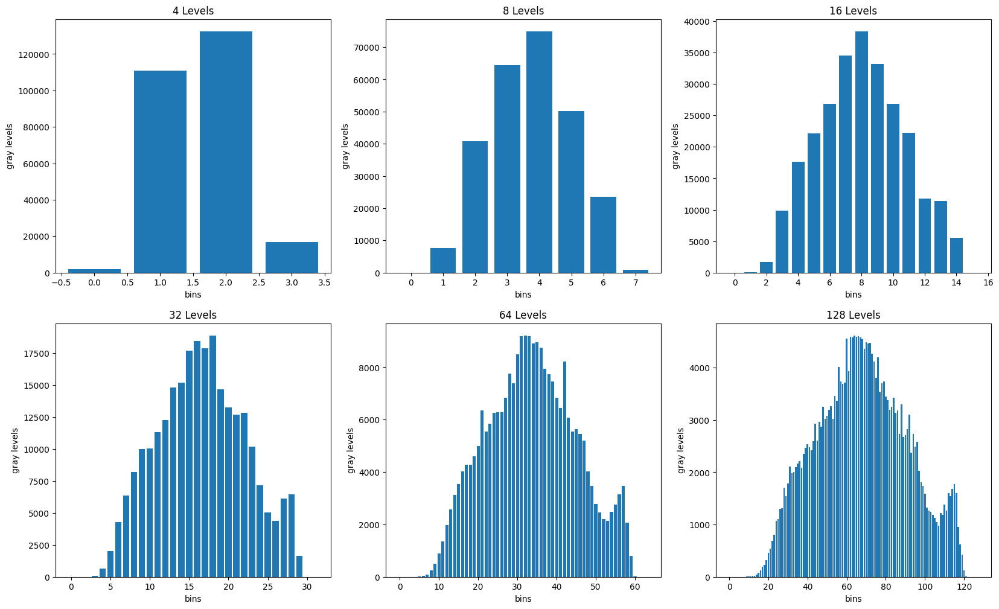

In [101]:
plt.figure(figsize=(20,12))

plt.subplot(2, 3, 1)
plt.title("4 Levels")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(4), Elaine_4_hist)

plt.subplot(2, 3, 2)
plt.title("8 Levels")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(8), Elaine_8_hist)

plt.subplot(2, 3, 3)
plt.title("16 Levels")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(16), Elaine_16_hist)

plt.subplot(2, 3, 4)
plt.title("32 Levels")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(32), Elaine_32_hist)

plt.subplot(2, 3, 5)
plt.title("64 Levels")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(64), Elaine_64_hist)

plt.subplot(2, 3, 6)
plt.title("128 Levels")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(128), Elaine_128_hist)

plt.show()


In [ ]:
equalizedImg_4 = cv2.equalizeHist(Elaine_4)
equalizedImg_8 = cv2.equalizeHist(Elaine_8)
equalizedImg_16 = cv2.equalizeHist(Elaine_16)
equalizedImg_32 = cv2.equalizeHist(Elaine_32)
equalizedImg_64 = cv2.equalizeHist(Elaine_64)
equalizedImg_128 = cv2.equalizeHist(Elaine_128)

equalizedImg = cv2.equalizeHist(Elaine)


In [ ]:
plt.imshow(equalizedImg,cmap="gray")
plt.show()

In [8]:
mse_4 = calculateMSE(Elaine_4, Elaine)
mse_8 = calculateMSE(Elaine_8, Elaine)
mse_16 = calculateMSE(Elaine_16, Elaine)
mse_32 = calculateMSE(Elaine_32, Elaine)
mse_64 = calculateMSE(Elaine_64, Elaine)
mse_128 = calculateMSE(Elaine_128, Elaine)

In [9]:
print("--------- Without Equalization ---------")
print("MSE 4   ->", mse_4)
print("MSE 8   ->", mse_8)
print("MSE 16  ->", mse_16)
print("MSE 32  ->", mse_32)
print("MSE 64  ->", mse_64)
print("MSE 128 ->", mse_128)

--------- Without Equalization ---------
MSE 4   -> 103.7153549194336
MSE 8   -> 91.5031967163086
MSE 16  -> 77.3164291381836
MSE 32  -> 17.381858825683594
MSE 64  -> 3.4688339233398438
MSE 128 -> 0.5092544555664062


In [10]:
mse_eq4 = calculateMSE(equalizedImg_4, Elaine)
mse_eq8 = calculateMSE(equalizedImg_8, Elaine)
mse_eq16 = calculateMSE(equalizedImg_16, Elaine)
mse_eq32 = calculateMSE(equalizedImg_32, Elaine)
mse_eq64 = calculateMSE(equalizedImg_64, Elaine)
mse_eq128 = calculateMSE(equalizedImg_128, Elaine)

In [11]:
print("--------- With Equalization ---------")
print("MSE 4   ->", mse_eq4)
print("MSE 8   ->", mse_eq8)
print("MSE 16  ->", mse_eq16)
print("MSE 32  ->", mse_eq32)
print("MSE 64  ->", mse_eq64)
print("MSE 128 ->", mse_eq128)

--------- With Equalization ---------
MSE 4   -> 108.32282638549805
MSE 8   -> 109.71194076538086
MSE 16  -> 108.87474060058594
MSE 32  -> 107.64651870727539
MSE 64  -> 107.3440933227539
MSE 128 -> 103.00044250488281


1.1.2. Write a program which can, firstly, downsample an image by a factor of 2, with and without using the averaging filter, and also, up-sample the previously downsampled images by a factor of 2, using the pixel replication and bilinear interpolation methods, respectively. Display (zoom of image) and discuss the results obtained with different methods for the Goldhill image. Note, you can use immse function for this problem.

In [72]:
goldhill = cv2.imread("Images/1/Goldhill.bmp", cv2.IMREAD_GRAYSCALE)


#Down sampling

In [73]:
def applyAvgFilter(img):
    [img_M, img_N] = img.shape
    maskLength = 3
    maskSize = maskLength ** 2
    
    # Develop Averaging filter(3, 3) mask
    mask = np.ones([maskLength, maskLength], dtype=int)
    mask = mask / maskSize

    # Convolve the 3X3 mask over the image
    filteredImg = np.zeros([img_M, img_N])

    for i in range(1, img_M - 1):
        for j in range(1, img_N - 1):
            temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0] + img[i, j] * \
                mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2,
                                                                         0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]

            filteredImg[i, j] = temp

    return filteredImg.astype(np.uint8)


In [74]:
def downsample(img, rate):
    # Assign a down sampling rate
    [img_M, img_N] = img.shape

    # Create a matrix of all zeros for
    # downsampled values
    downSapmledImg = np.zeros((img_M // rate, img_N // rate), dtype=int)

    # Assign the down sampled values from the original
    # image according to the down sampling frequency.
    # For example, if the down sampling rate f=2, take
    # pixel values from alternate rows and columns
    # and assign them in the matrix created above
    for i in range(0, img_M, rate):
        for j in range(0, img_N, rate):
            downSapmledImg[i//rate][j//rate] = img[i][j]

    return downSapmledImg


#Up sampling

In [75]:
def get_array_value(x: int, y: int, array: np.ndarray):
    """Returns the value of the array at position x,y."""
    return array[y, x]


In [76]:
def interpolate(first_value: float, second_value: float, ratio: float) -> float:
    """Interpolate with a linear weighted sum."""
    return first_value * (1 - ratio) + second_value * ratio


In [77]:
def bilinear_interpolation(x: float, y: float, img: np.ndarray) -> float:
    """Returns the bilinear interpolation of a pixel in the image.
    :param x: x-position to interpolate
    :param y: y-position to interpolate
    :param img: image, where the pixel should be interpolated
    :returns: value of the interpolated pixel
    """
    if x < 0 or y < 0:
        raise ValueError("x and y pixel position have to be positive!")
    if img.shape[1] - 1 < x or img.shape[0] - 1 < y:
        raise ValueError(
            "x and y pixel position have to be smaller than image" "dimensions."
        )

    x_rounded_up = int(math.ceil(x))
    x_rounded_down = int(math.floor(x))
    y_rounded_up = int(math.ceil(y))
    y_rounded_down = int(math.floor(y))

    ratio_x = x - x_rounded_down
    ratio_y = y - y_rounded_down

    interpolate_x1 = interpolate(
        get_array_value(x_rounded_down, y_rounded_down, img),
        get_array_value(x_rounded_up, y_rounded_down, img),
        ratio_x,
    )
    interpolate_x2 = interpolate(
        get_array_value(x_rounded_down, y_rounded_up, img),
        get_array_value(x_rounded_up, y_rounded_up, img),
        ratio_x,
    )
    interpolate_y = interpolate(interpolate_x1, interpolate_x2, ratio_y)

    return interpolate_y


In [92]:
def upsample(img, rate):

    m = img.shape[0] * rate
    n = img.shape[1] * rate

    # Create matrix of zeros to store the upsampled image
    upsampledImg = np.zeros((m, n), dtype=int)
    # new size
    for i in range(0, m-1, rate):
        for j in range(0, n-1, rate):
            upsampledImg[i, j] = img[i//rate][j//rate]

    # interpolation

    bilinearInterpolated_img = np.array(upsampledImg)
    nearestNeighbourInterpolated_img = np.array(upsampledImg)
    # Replicating rows
    for i in range(1, m-(rate-1), rate):
        for j in range(0, n-(rate-1)):
            for h in range(i, i+(rate-1)):
                bilinearInterpolated_img[h][j] = bilinear_interpolation(
                    h, j, upsampledImg)
                nearestNeighbourInterpolated_img[h][j] = upsampledImg[h-1][j]

    # Replicating columns
    for i in range(0, m-1):
        for j in range(1, n-1, rate):
            for k in range(j, j+(rate-1)):
                bilinearInterpolated_img[i][k] = bilinear_interpolation(
                    i, k, upsampledImg)
                nearestNeighbourInterpolated_img[i][k] = upsampledImg[i][k-1]

    return bilinearInterpolated_img, nearestNeighbourInterpolated_img


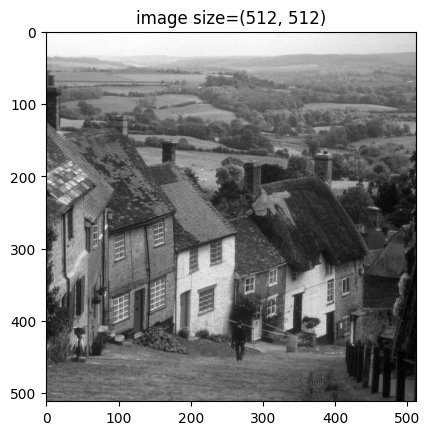

In [79]:
# original image
plt.imshow(goldhill, cmap="gray")
plt.title("image size=" + str(goldhill.shape))
plt.show()


In [ ]:
# downsample image
downsampled_goldhill = downsample(goldhill, 2)
plt.imshow(downsampled_goldhill, cmap="gray")
plt.title("image size=" + str(downsampled_goldhill.shape))
plt.show()


In [ ]:
# downsample image + averaging filter
filtered_goldhill = applyAvgFilter(goldhill)
plt.imshow(filtered_goldhill, cmap="gray")
plt.title("image size=" + str(filtered_goldhill.shape))
plt.show()


downsampled_filtered_goldhill = downsample(filtered_goldhill, 2)
plt.title("image size=" + str(downsampled_filtered_goldhill.shape))
plt.imshow(downsampled_filtered_goldhill, cmap="gray")
plt.show()

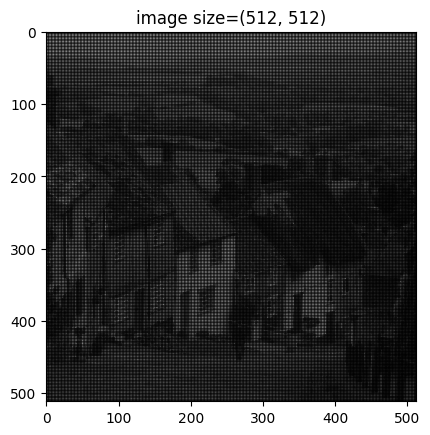

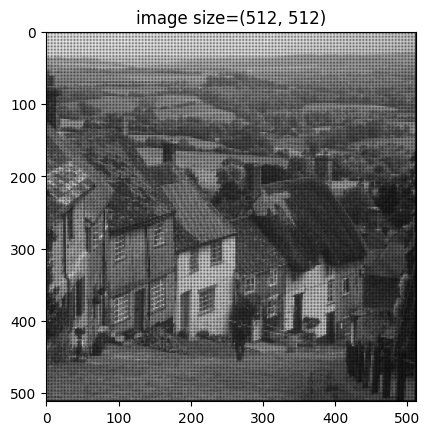

In [93]:
# upsample image
upsampled_goldhill_bilinear,upsampled_goldhill_nearest = upsample(downsampled_goldhill, 2)
plt.imshow(upsampled_goldhill_bilinear, cmap="gray")
plt.title("image size=" + str(upsampled_goldhill_bilinear.shape))
plt.show()

plt.imshow(upsampled_goldhill_nearest, cmap="gray")
plt.title("image size=" + str(upsampled_goldhill_nearest.shape))
plt.show()


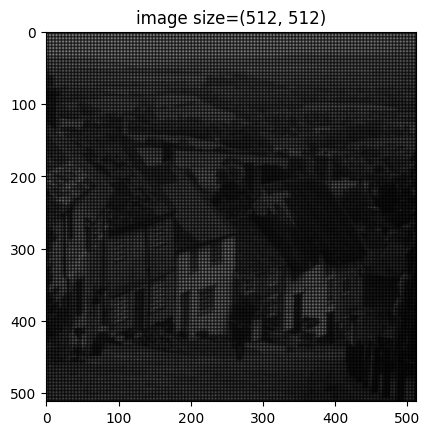

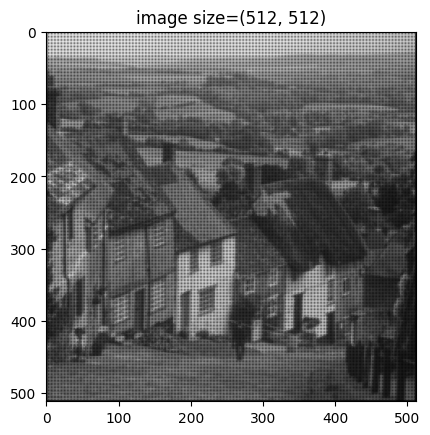

In [94]:
# upsample image + averaging filter
upsampled_filtered_goldhill_bilinear,upsampled_filtered_goldhill_nearest = upsample(downsampled_filtered_goldhill, 2)
plt.imshow(upsampled_filtered_goldhill_bilinear, cmap="gray")
plt.title("image size=" + str(upsampled_filtered_goldhill_bilinear.shape))
plt.show()

plt.imshow(upsampled_filtered_goldhill_nearest, cmap="gray")
plt.title("image size=" + str(upsampled_filtered_goldhill_nearest.shape))
plt.show()

In [96]:
print("----- MSE -----")
print("averaging & nearest           ->", calculateMSE(goldhill,upsampled_filtered_goldhill_nearest))
print("averaging & bilinear          -> ", calculateMSE(goldhill,upsampled_filtered_goldhill_bilinear))

print("remove row-column & nearest   ->", calculateMSE(goldhill,upsampled_goldhill_nearest))
print("remove row-column & bilinear  ->", calculateMSE(goldhill,upsampled_goldhill_bilinear))


----- MSE -----
averaging & nearest           -> 4005.0396118164062
averaging & bilinear          ->  11329.013565063477
remove row-column & nearest   -> 3832.00927734375
remove row-column & bilinear  -> 11253.3671875


1.1.3. The initial image consists of eight bits of data for each pixel. Create new images using 5, 4, 3, 2 and 1 bit only for each pixel. How many bits are needed to preserve image quality? Does it change from place to place in the image? Discuss about the results. (Test Image Grayscale of Barbara).

In [24]:
def changePixelBits(img, bits):
    MIN = 0
    MAX = 255
    NEW_MAX = 2 ** bits - 1
    NEW_MIN = 0

    convertedImg = (((img - MIN) / (MAX - MIN)) *
                    (NEW_MAX - NEW_MIN)) + NEW_MIN
    convertedImg = np.round(convertedImg)
    convertedImg = convertedImg.astype(int)
    return convertedImg

In [25]:
Barbara = cv2.imread("images/1/Barbara.bmp", cv2.IMREAD_GRAYSCALE)

In [26]:
Barbara_5 = changePixelBits(Barbara, 5)
Barbara_4 = changePixelBits(Barbara, 4)
Barbara_3 = changePixelBits(Barbara, 3)
Barbara_2 = changePixelBits(Barbara, 2)
Barbara_1 = changePixelBits(Barbara, 1)

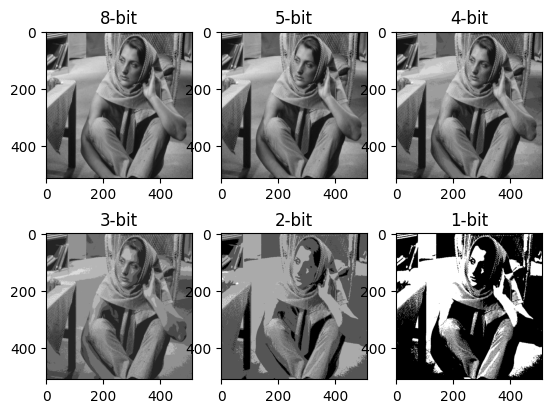

In [27]:
plt.subplot(2, 3, 1)
plt.title("8-bit")
plt.imshow(Barbara, cmap="gray")

plt.subplot(2, 3, 2)
plt.title("5-bit")
plt.imshow(Barbara_5, cmap="gray")

plt.subplot(2, 3, 3)
plt.title("4-bit")
plt.imshow(Barbara_4, cmap="gray")

plt.subplot(2, 3, 4)
plt.title("3-bit")
plt.imshow(Barbara_3, cmap="gray")

plt.subplot(2, 3, 5)
plt.title("2-bit")
plt.imshow(Barbara_2, cmap="gray")

plt.subplot(2, 3, 6)
plt.title("1-bit")
plt.imshow(Barbara_1, cmap="gray")

plt.show()


2. Contrast Adjustment<br>
    2.1. Histogram Equalization


2.1.1. Write a program that can compute the histogram of a grayscale image (assuming 256 levels of gray). In a separate main program, apply the program to Camera Man image, and illustrate the histogram as a stem plot besides the test image (using “subplot” function).

In [99]:
camera_man = cv2.imread("images/2/Camera Man.bmp", cv2.IMREAD_GRAYSCALE)
m = camera_man.shape[0]
n = camera_man.shape[1]

In [100]:
def calculateHist(img, noBins=256):
    histValues = np.zeros(noBins, dtype=int)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            grayLevel1 = img[i][j]
            histValues[grayLevel1] += 1

    return histValues

In [98]:
bins = np.empty(256, dtype=int)
for i in range(256):
    bins[i] = i

In [102]:
camera_man_histValues = calculateHist(camera_man)

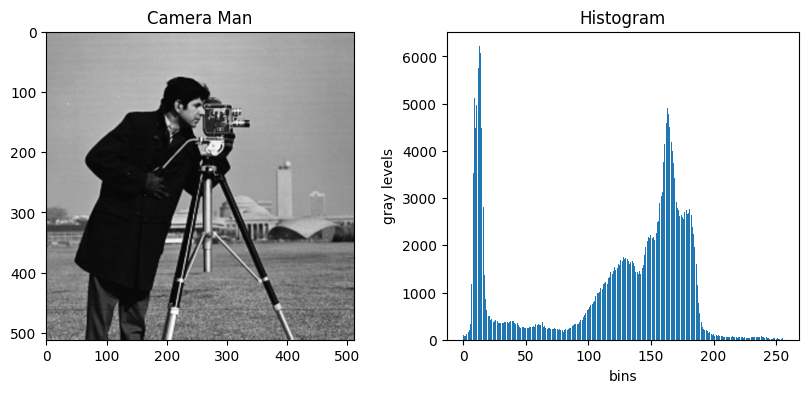

In [108]:
plt.figure(figsize=(10,4))

plt.subplot(1, 2, 1)
plt.title("Camera Man")
plt.imshow(camera_man, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Histogram")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(256), camera_man_histValues)

plt.show()


2.1.1.1. Decrease the brightness of Camera Man by dividing the intensity values by 3 and named output as D.

In [110]:
D = np.empty((m, n))

for i in range(m):
    for j in range(n):
        D[i][j] = int(camera_man[i][j] / 3)

D = D.astype(np.uint8)

In [33]:
cv2.imwrite("outputs/2/D.bmp", D)

True

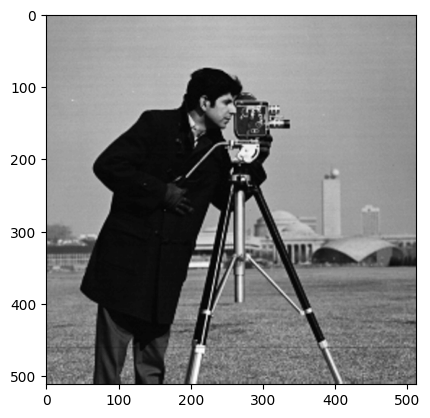

-1

In [111]:
plt.imshow(D, cmap="gray")
plt.show()

cv2.imshow(winname="D", mat=D)
cv2.waitKey(0)


2.1.1.2. Plot the histograms of Input and D. What can you observe from these two histograms?

In [113]:
# D = cv2.imread("D.bmp")
D_hist_values = calculateHist(D)


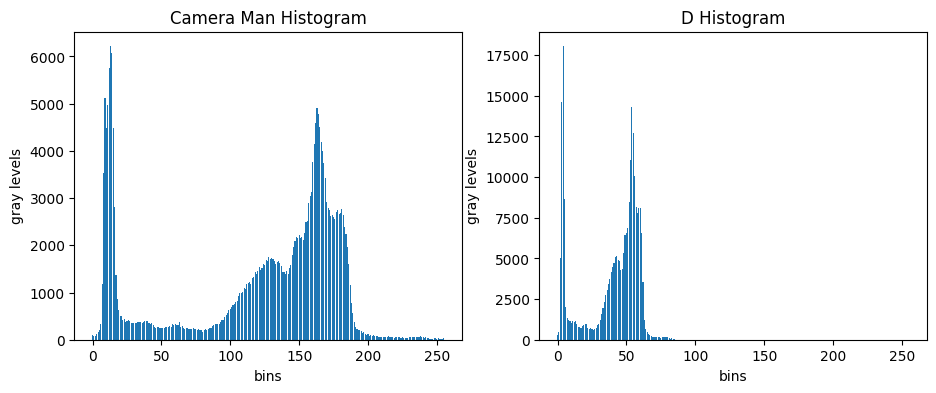

In [128]:
plt.figure(figsize=(11,4))

plt.subplot(1,2,1)
plt.title("Camera Man Histogram")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(bins, camera_man_histValues)

plt.subplot(1,2,2)
plt.title("D Histogram")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(bins, D_hist_values)
plt.savefig("outputs/2/D histogram")

plt.show()


2.1.1.3. Perform histogram equalization on D and output the result as H.

In [131]:
def calculatePDF(histValues, imgSize):
    return histValues / imgSize


In [135]:
def calculateCDF(PDF_vector):
    CDF_vector = np.zeros(256, dtype=float)
    for i in range(256):
        for j in range(i+1):
            CDF_vector[i] += PDF_vector[j]

    return CDF_vector


In [132]:
def equalizeHist(histValues, imgSize):
    PDF_vector = calculatePDF(histValues, imgSize)
    CDF_vector = calculateCDF(PDF_vector)
    return CDF_vector * 255

In [141]:
def equalizeImage(img):
    histvalues = calculateHist(img)
    [m, n] = img.shape
    imgSize = m * n
    equalizedHist = equalizeHist(histvalues, imgSize)

    equalizedImg = np.empty((m, n),dtype=int)
    for i in range(m):
        for j in range(n):
            equalizedImg[i][j] = equalizedHist[img[i][j]]

    return equalizedImg


In [148]:
D_m = D.shape[0]
D_n = D.shape[1]
D_size = D_m * D_n

equalized_D_hist_values = equalizeHist(D_hist_values, D_size)
H = equalizeImage(D)

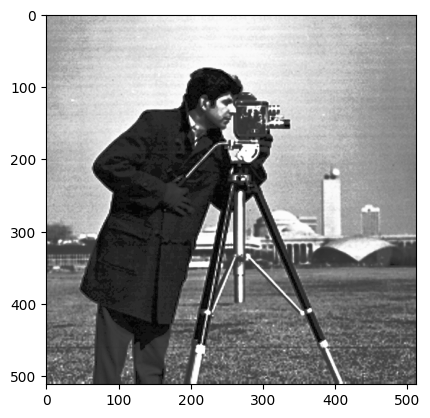

In [149]:
# plt.title("H Histogram (D equalization)")
# plt.xlabel("bins")
# plt.ylabel("gray levels")
# plt.bar(bins, equalized_D_hist_values)
# plt.show()

plt.imshow(H,cmap="gray")
plt.savefig("outputs/2/H")
plt.show()

2.1.1.4. Perform local histogram equalization on image D and output the result as L.

In [152]:
def addpadding(source, pad):
    imarr = np.array(source)
    padimarr = np.zeros(
        (imarr.shape[0]+2*pad, imarr.shape[1]+2*pad), dtype=np.uint8)
    padimarr[pad:padimarr.shape[0]-pad, pad:padimarr.shape[1]-pad] = imarr
    return padimarr


def part(window):  # local hist. eq. function
    WINDOW_LENGTH = window.shape[0]
    WINDOW_SIZE = WINDOW_LENGTH ** 2

    possibility = [0 for i in range(256)]  # need for window hist. eq.
    for v in range(WINDOW_LENGTH):
        for h in range(WINDOW_LENGTH):
            P = window[v][h]
            possibility[P] = possibility[P] + 1

    for o in range(256):
        possibility[o] = float(
            float(float(possibility[o]) / WINDOW_SIZE) * 255)
        possibility[o] = int(round(possibility[o]))

    CENTER_PIXEL_CORDINATES = int(WINDOW_LENGTH/2)
    S = window[CENTER_PIXEL_CORDINATES][CENTER_PIXEL_CORDINATES]

    return possibility[S]


def equalizeImg_locally(img, window_length):
    sizex = img.shape[0]
    sizey = img.shape[1]

    # window_length = (2 * pad) + 1
    pad = int(window_length/2)
    image = addpadding(img, pad)

    Matrix = np.empty(image.shape)

    for i in range(sizex):
        for y in range(sizey):
            window = np.empty((window_length, window_length), dtype=int)
            for h in range(window_length):
                for v in range(window_length):
                    window[h][v] = image[i+h][y+v]
            Matrix[i+pad][y + pad] = part(window)

    # again convert orjinal  size"example 512 x 512 image"
    MatrixFinish = np.empty((sizex, sizey), dtype=int)
    for k in range(sizex):
        for t in range(sizey):
            MatrixFinish[k][t] = Matrix[k + pad][t + pad]

    return MatrixFinish


In [153]:
# D = cv2.imread("outputs/2/D.bmp", cv2.IMREAD_GRAYSCALE)

L = equalizeImg_locally(img=D, window_length=3)

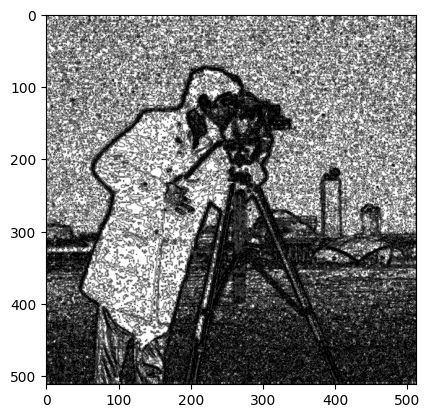

True

In [154]:
plt.imshow(L,cmap="gray")
plt.show()

cv2.imwrite("outputs/2/L.png",L)


2.1.1.5. Plot the histograms of H and L. What’s the main difference between local and global histogram equalization?

In [155]:
H_histValues = calculateHist(H)
L_histvalues = calculateHist(L)

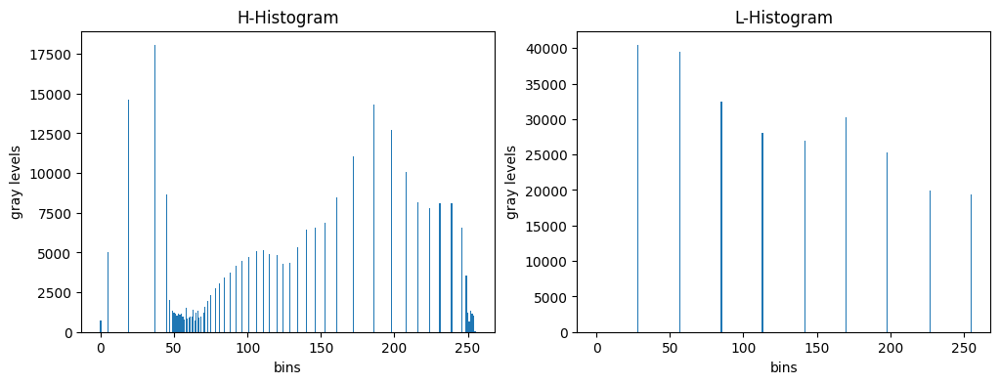

In [158]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.title("H-Histogram")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(256), H_histValues)

plt.subplot(1, 2, 2)
plt.title("L-Histogram")
plt.xlabel("bins")
plt.ylabel("gray levels")
plt.bar(getBins(256), L_histvalues)

plt.show()


2.1.1.6. Perform the log transform, inverse log transform and power-law transform to enhance image D. Please adjust the parameters to obtain the results as best as you can. Show the parameters, resultant images and corresponding histograms. Provide some discussions on the results as well.

In [175]:
def calculateC(img):
    return 255 / np.log(1 + np.max(img))

In [176]:
best_c = calculateC(D)

#Log Transform

In [161]:
def applyLogTransform(img, c):
    log_image = c * (np.log(img + 1))

    # Specify the data type so that
    # float value will be converted to int
    return np.array(log_image, dtype=np.uint8)


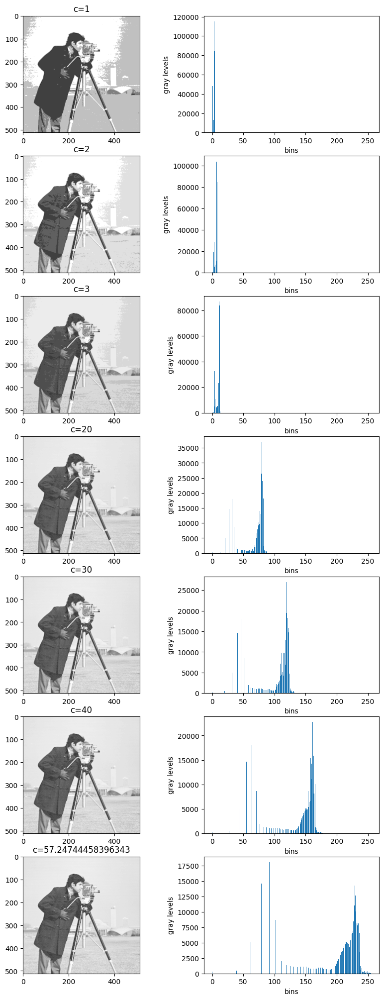

True

In [184]:
c_values = [1, 2, 3, 20, 30, 40, best_c]
counter = 1

plt.figure(figsize=(10,25))
for c in c_values:
    log_D = applyLogTransform(D, c)
    log_D_histvalues = calculateHist(log_D)

    plt.subplot(7,2,counter)
    plt.title("c=" + str(c))
    plt.imshow(log_D, cmap="gray")    

    counter += 1
    plt.subplot(7,2,counter)
    plt.xlabel("bins")
    plt.ylabel("gray levels")
    plt.bar(getBins(256), log_D_histvalues)

    counter += 1
    
plt.show()

cv2.imwrite("outputs/2/log_D.png", log_D)


#Inverse Log Transform

In [189]:
def applyInverseLogTransform(img, c):
    inverse_log_image = (10 ** (img / c)) - 1
    return np.array(inverse_log_image, dtype=np.uint8)

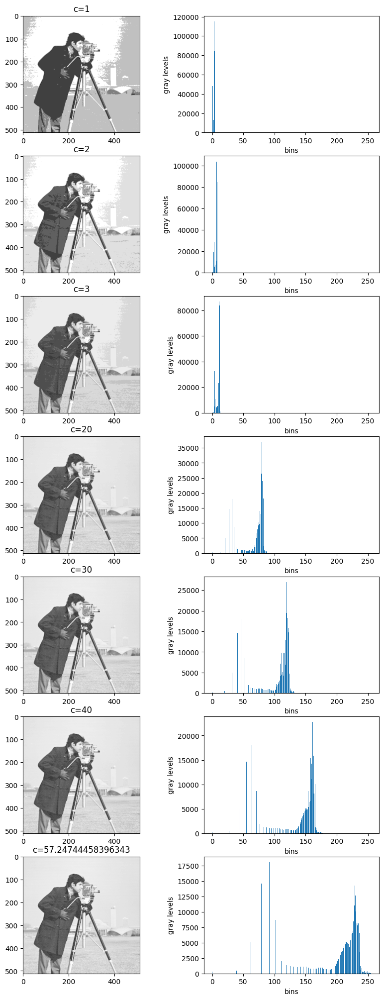

In [195]:
c_values = [1, 2, 3, 20, 30, 40, best_c]
counter = 1

plt.figure(figsize=(10,25))
for c in c_values:
    inverse_log_D = applyLogTransform(D, c)
    inverse_log_D_histvalues = calculateHist(inverse_log_D)

    plt.subplot(7,2,counter)
    plt.title("c=" + str(c))
    plt.imshow(inverse_log_D, cmap="gray")    

    counter += 1
    plt.subplot(7,2,counter)
    plt.xlabel("bins")
    plt.ylabel("gray levels")
    plt.bar(getBins(256), inverse_log_D_histvalues)

    counter += 1
    
plt.show()

#Power-Law Log Transform

In [196]:
def applyPowerTransform(img, gamma):
    # Apply gamma correction.
    return np.array(255 * (img / 255) ** gamma, dtype='uint8')

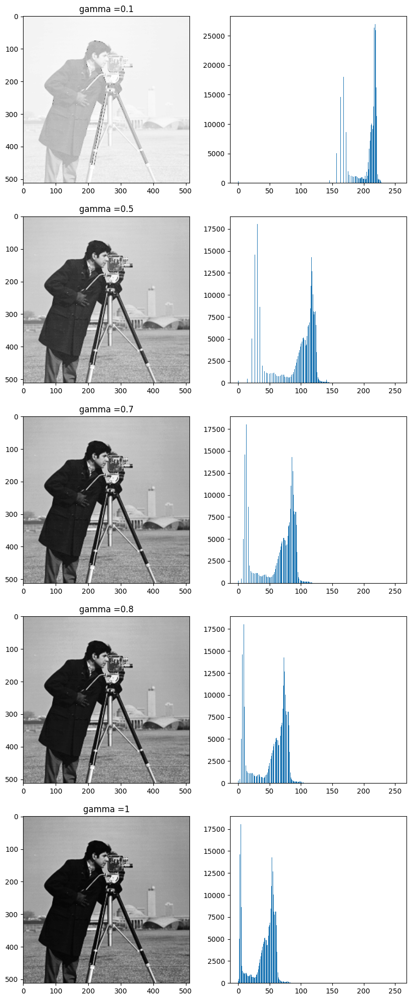

In [203]:
# Trying 4 gamma values.
gammaValues = [0.1, 0.5, 0.7, 0.8, 1]

counter = 1
plt.figure(figsize=(10, 25))
for gamma in gammaValues:

    # Apply gamma correction.
    gamma_corrected = applyPowerTransform(D, gamma)
    histValues = calculateHist(gamma_corrected)
    plt.subplot(5, 2, counter)
    plt.title("gamma =" + str(gamma))
    plt.imshow(gamma_corrected, cmap="gray")
    counter += 1

    plt.subplot(5, 2, counter)
    plt.bar(getBins(256), histValues)
    counter += 1
plt.show()


2.1.2. Write a program that performs histogram equalization on Camera Man image. Display the original and equalized images, as well as their corresponding histograms, all in one figure as mentioned in 2.1.1.

In [206]:
equalized_camera_man = equalizeImage(camera_man)


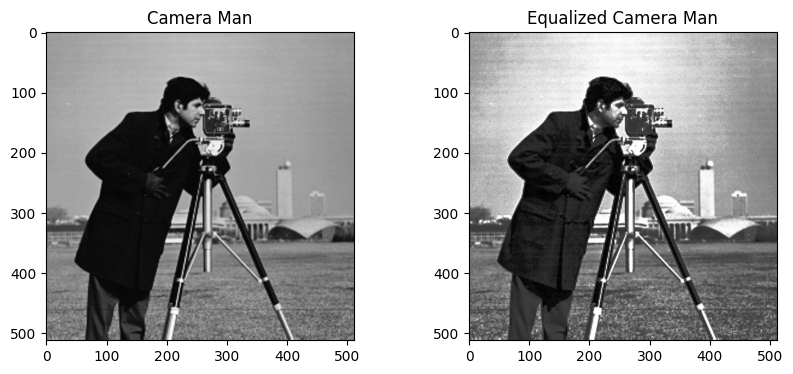

In [209]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.title("Camera Man")
plt.imshow(camera_man, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Equalized Camera Man")
plt.imshow(equalized_camera_man, cmap="gray")

plt.show()


2.1.3. What is the difference between histeq and imadjust functions in Matlab? Play with these functions with various input parameters for Camera Man image. Write down your observations in your report and display results.

2.2. Local Histogram Equalization

2.2.1. Implement a local histogram equalization with different windows size for the HE1,2,3, and 4 images. Explain and display the results. Discuss the effects of increasing window size and compare it with global histogram equalization in detail.

In [131]:
HE_images = []
HE_images.append(cv2.imread("Images/2/HE1.jpg",cv2.IMREAD_GRAYSCALE))
HE_images.append(cv2.imread("Images/2/HE2.jpg",cv2.IMREAD_GRAYSCALE)) 
HE_images.append(cv2.imread("Images/2/HE3.jpg",cv2.IMREAD_GRAYSCALE))
HE_images.append(cv2.imread("Images/2/HE4.jpg",cv2.IMREAD_GRAYSCALE))

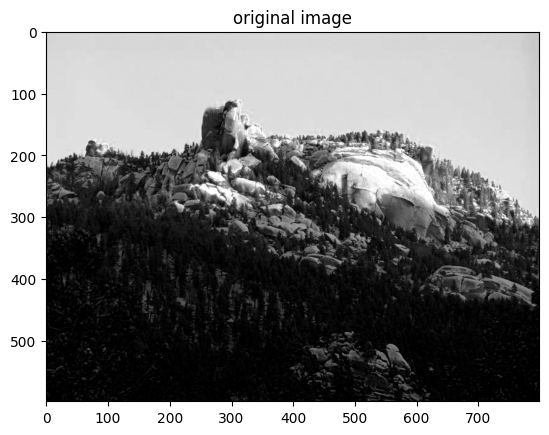

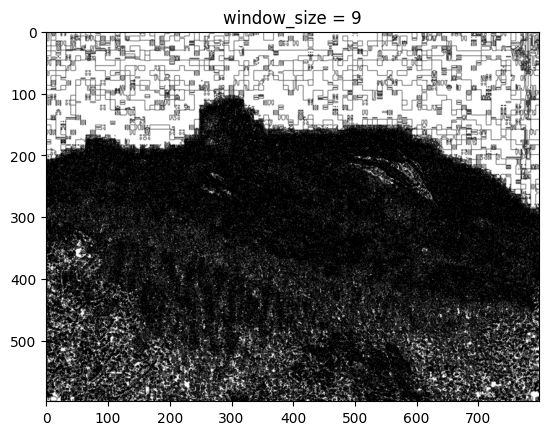

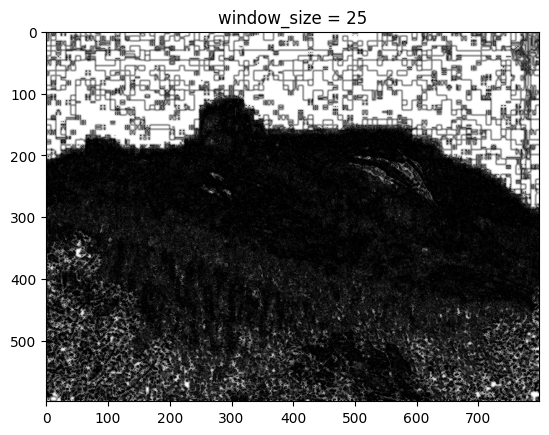

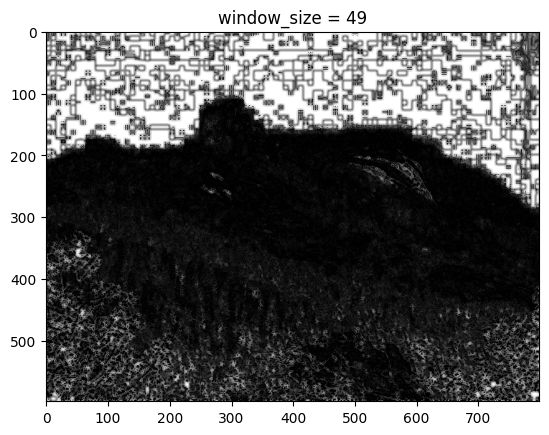

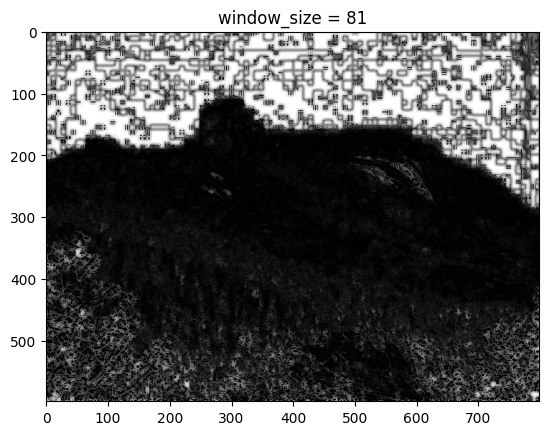

...

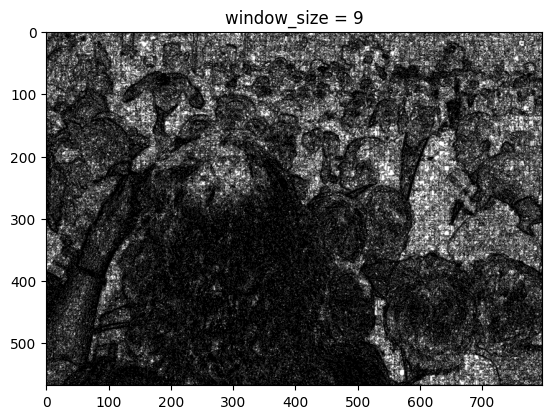

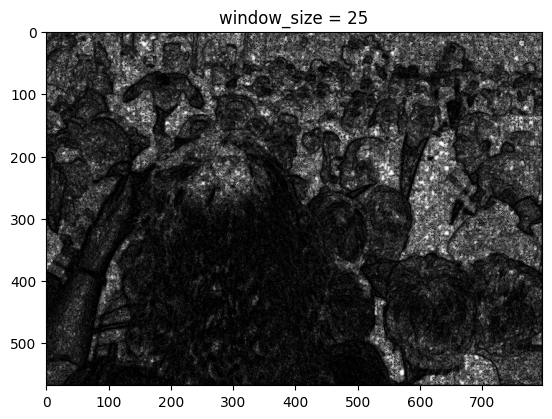

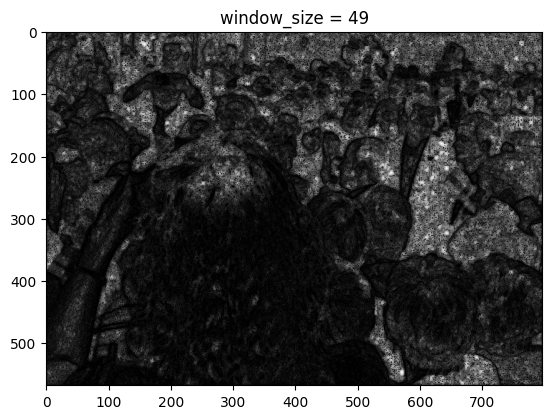

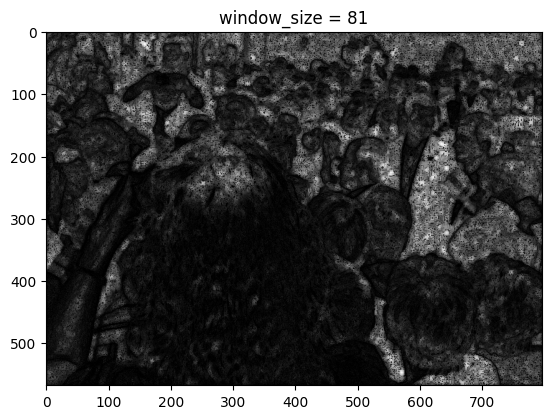

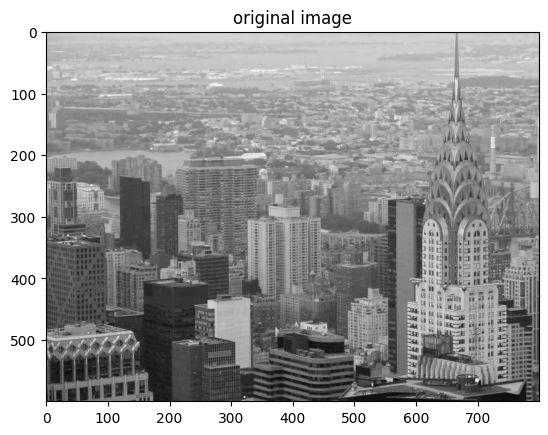

KeyboardInterrupt: 

In [137]:
window_lengthes = [3, 5, 7, 9]

for HE_img in HE_images:
    plt.title("original image")
    plt.imshow(HE_img, cmap="gray")
    plt.show()

    for window_length in window_lengthes:
        equlized_HE_img = equalize_locally(HE_img, window_length)
        plt.title("window_size = " + str(window_length ** 2))
        plt.imshow(equlized_HE_img, cmap="gray")
        plt.show()
